In [1]:
"""
Cacti_Classification.ipynb

Author - Ethan Dowalter - edowalte@uwyo.edu

Description: This file attempts to build a neural network model to perform binary classification (cactus or non-cactus) on point clouds containing columnar cacti
"""

'\nCacti_Classification.ipynb\n\nAuthor - Ethan Dowalter - edowalte@uwyo.edu\n\nDescription: This file attempts to build a neural network model to perform binary classification (cactus or non-cactus) on point clouds containing columnar cacti\n'

In [2]:
# This first cell is all about loading in the data and preprocessing it to then use to train and test the models

import laspy
import pandas
import numpy
import time
import random
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
%matplotlib widget

def read_las_to_dataframe(file_path):
    # Open the LAS file
    las_file = laspy.read(file_path)

    # Extract the x, y, z point data
    points = numpy.vstack([las_file.x, las_file.y, las_file.z]).T

    # Create a Pandas DataFrame
    columns = ['X', 'Y', 'Z']
    df = pandas.DataFrame(points, columns=columns)

    # Add additional information if needed
    for dimension in las_file.point_format.dimension_names:
        if dimension not in columns:
            # KEY: Convert all columns to numpy arrays to avoid malformed dataframe
            df[dimension] = numpy.array(las_file[dimension])

    return df


# NOTE: The manually classified point clouds lost their intensity values for some reason

# File paths for unclassified point clouds
# cg_01 = '../CactusClouds/CG_01_PointCloud.las'
# cg_02 = '../CactusClouds/CG_02_Last_PointCloud.las'
# cg_03 = '../CactusClouds/CG_03_Drone_PointCloud.las'
# cg_04 = '../CactusClouds/CG_04_PointCloud.las'
# cg_05 = '../CactusClouds/CG_05_PointCloud.las'
# op_01 = '../CactusClouds/OP_01_DronePointCloud.las'
# op_02 = '../CactusClouds/OP_02_PhonePointCloud.las'
# op_03 = '../CactusClouds/OP_03_DronePointCloud.las'
# op_04 = '../CactusClouds/OP_04_DronePointCloud.las'
# op_05 = '../CactusClouds/OP_05_DronePointCloud.las'

# File paths for classified point clouds
cg_01 = '../CactusClouds/CG_01_Classified.las'
cg_02 = '../CactusClouds/CG_02_Classified.las'
cg_03 = '../CactusClouds/CG_03_Classified.las'
cg_04 = '../CactusClouds/CG_04_Classified.las'
cg_05 = '../CactusClouds/CG_05_Classified.las'
op_01 = '../CactusClouds/OP_01_Classified.las'
op_02 = '../CactusClouds/OP_02_Classified.las'
op_03 = '../CactusClouds/OP_03_Classified.las'
op_04 = '../CactusClouds/OP_04_Classified.las'
op_05 = '../CactusClouds/OP_05_Classified.las'
# op_05 = '../CactusClouds/OP_05_Classified(extra).las'

# Load the data into dataframes
df_cg_01 = read_las_to_dataframe(cg_01)
df_cg_02 = read_las_to_dataframe(cg_02)
df_cg_03 = read_las_to_dataframe(cg_03)
df_cg_04 = read_las_to_dataframe(cg_04)
df_cg_05 = read_las_to_dataframe(cg_05)
df_op_01 = read_las_to_dataframe(op_01)
df_op_02 = read_las_to_dataframe(op_02)
df_op_03 = read_las_to_dataframe(op_03)
df_op_04 = read_las_to_dataframe(op_04)
df_op_05 = read_las_to_dataframe(op_05)

# Display the dataframes
display(df_cg_01.describe())
# display(df_cg_02.describe())
# display(df_cg_03.describe())
# display(df_cg_04.describe())
# display(df_cg_05.describe())
# display(df_op_01.describe())
# display(df_op_02.describe())
# display(df_op_03.describe())
# display(df_op_04.describe())
# display(df_op_05.describe())

# Cull unnecessary columns
# We keep columns X, Y, Z, (0, 1, 2), classification (8), and red, green, blue (15, 16, 17)
def CullColumns(df):
    df.drop(df.columns[[3,4,5,6,7,9,10,11,12,13,14,18,19,20,21]], axis=1, inplace=True)
    return df

df_cg_01 = CullColumns(df_cg_01)
df_cg_02 = CullColumns(df_cg_02)
df_cg_03 = CullColumns(df_cg_03)
df_cg_04 = CullColumns(df_cg_04)
df_cg_05 = CullColumns(df_cg_05)
df_op_01 = CullColumns(df_op_01)
df_op_02 = CullColumns(df_op_02)
df_op_03 = CullColumns(df_op_03)
df_op_04 = CullColumns(df_op_04)
df_op_05 = CullColumns(df_op_05)

# Reorder columns to make sure 'classification' is on the end
df_cg_01 = df_cg_01[['X', 'Y', 'Z', 'red', 'green', 'blue', 'classification']]
df_cg_02 = df_cg_02[['X', 'Y', 'Z', 'red', 'green', 'blue', 'classification']]
df_cg_03 = df_cg_03[['X', 'Y', 'Z', 'red', 'green', 'blue', 'classification']]
df_cg_04 = df_cg_04[['X', 'Y', 'Z', 'red', 'green', 'blue', 'classification']]
df_cg_05 = df_cg_05[['X', 'Y', 'Z', 'red', 'green', 'blue', 'classification']]
df_op_01 = df_op_01[['X', 'Y', 'Z', 'red', 'green', 'blue', 'classification']]
df_op_02 = df_op_02[['X', 'Y', 'Z', 'red', 'green', 'blue', 'classification']]
df_op_03 = df_op_03[['X', 'Y', 'Z', 'red', 'green', 'blue', 'classification']]
df_op_04 = df_op_04[['X', 'Y', 'Z', 'red', 'green', 'blue', 'classification']]
df_op_05 = df_op_05[['X', 'Y', 'Z', 'red', 'green', 'blue', 'classification']]

display(df_cg_01.head())

# Scale the data to have 0 mean and unit standard deviation for the X, Y, and Z
# and divide intensity, red, green, and blue by 65536 to scale to between 0-1
def ScaleData(df):
    scaler = StandardScaler()
    # NOTE: Attempted model training with the MinMaxScaler but results showed that the StandardScaler performed better
    # scaler = MinMaxScaler((-1,1))
    scaled_data = scaler.fit_transform(df)
    scaled_df = df
    scaled_df['X'] = scaled_data[:,0]
    scaled_df['Y'] = scaled_data[:,1]
    scaled_df['Z'] = scaled_data[:,2]
    # scaled_df['intensity'] = df['intensity'] / 65536.0
    scaled_df['red'] = df['red'] / 65536.0
    scaled_df['green'] = df['green'] / 65536.0
    scaled_df['blue'] = df['blue'] / 65536.0

    return scaled_df, scaler

df_cg_01, cg_01_scaler = ScaleData(df_cg_01)
df_cg_02, cg_02_scaler = ScaleData(df_cg_02)
df_cg_03, cg_03_scaler = ScaleData(df_cg_03)
df_cg_04, cg_04_scaler = ScaleData(df_cg_04)
df_cg_05, cg_05_scaler = ScaleData(df_cg_05)
df_op_01, op_01_scaler = ScaleData(df_op_01)
df_op_02, op_02_scaler = ScaleData(df_op_02)
df_op_03, op_03_scaler = ScaleData(df_op_03)
df_op_04, op_04_scaler = ScaleData(df_op_04)
df_op_05, op_05_scaler = ScaleData(df_op_05)

# Show preview of the data
display("Scaled df_cg_01.head():", df_cg_01.head())
print("Scaled df_cg_01.shape: ", df_cg_01.shape)

# DEPRECATED DOWNSAMPLING CODE (keeping just in case)
# Remove some random data to speed up calculations (just for testing and plotting)
# def RemoveData(df, remove_factor):
#     assert (remove_factor > 0 and remove_factor < 1) , "RemoveData - remove_factor parameter must be between 0 and 1"
#     remove_n = int(len(df.index) * remove_factor)
#     drop_indices = numpy.random.choice(df.index, remove_n, replace=False)
#     df_subset = df.drop(drop_indices)
    
#     return df_subset

# remove_factor = 0.99
# df_cg_01 = RemoveData(df_cg_01, remove_factor)
# df_cg_02 = RemoveData(df_cg_02, remove_factor)
# df_cg_03 = RemoveData(df_cg_03, remove_factor)
# df_cg_04 = RemoveData(df_cg_04, remove_factor)
# df_cg_05 = RemoveData(df_cg_05, remove_factor)
# df_op_01 = RemoveData(df_op_01, remove_factor)
# df_op_02 = RemoveData(df_op_02, remove_factor)
# df_op_03 = RemoveData(df_op_03, remove_factor)
# df_op_04 = RemoveData(df_op_04, remove_factor)
# df_op_05 = RemoveData(df_op_05, remove_factor)

# Downsample point clouds to only keep n number of points, that way each point cloud contains the same amount
# Additionally, control the class imbalance ratio for better model results
def KeepNData(df, n):
    assert (df.shape[0] >= n) , "KeepNData - n parameter must be less than or equal to the length of the dataframe"
    # The ratio of cactus to non-cactus points in the point clouds is very small, so in an effort to maybe give the model more positive class points to learn from
    # I added code which can assign a preset ratio (with a touch of random noise to prevent overfitting) of points to keep. 
    
    # Separate point cloud based on classification
    cactus_df = df[df['classification'] != 0]
    noncactus_df = df[df['classification'] == 0]
    print("Total cactus points:", len(cactus_df), " / ", len(cactus_df) + len(noncactus_df), " = ", len(cactus_df) / (len(cactus_df) + len(noncactus_df)))
    
    # Class imbalance ratio - found that 3-97 provides a good split to keep accuracy and recall scores generally high
    # Increasing the ratio leads to higher recall, but generally lower accuracy
    percent_cactus = 0.03 + (random.randint(-100, 100) / 100000)
    num_cactus_pts = int(n * percent_cactus)
    num_other_pts = int(n * (1 - percent_cactus))
    
    # Drop enough points to be left with the desired amount
    drop_indices = numpy.random.choice(cactus_df.index, cactus_df.shape[0] - num_cactus_pts, replace=False)
    cactus_subset = cactus_df.drop(drop_indices)
    drop_indices = numpy.random.choice(noncactus_df.index, noncactus_df.shape[0] - num_other_pts, replace=False)
    noncactus_subset = noncactus_df.drop(drop_indices)
        
    # Recombine dataframes
    result_df = pandas.concat([cactus_subset, noncactus_subset], axis=0)
    result_df.sort_index(inplace=True)  
    
    return result_df

keep_n = 100000
df_cg_01 = KeepNData(df_cg_01, keep_n)
df_cg_02 = KeepNData(df_cg_02, keep_n)
df_cg_03 = KeepNData(df_cg_03, keep_n)
df_cg_04 = KeepNData(df_cg_04, keep_n)
df_cg_05 = KeepNData(df_cg_05, keep_n)
df_op_01 = KeepNData(df_op_01, keep_n)
df_op_02 = KeepNData(df_op_02, keep_n)
df_op_03 = KeepNData(df_op_03, keep_n)
df_op_04 = KeepNData(df_op_04, keep_n)
df_op_05 = KeepNData(df_op_05, keep_n)

print("Downsampled df_cg_01.shape:", df_cg_01.shape)

# Adjust the positive classification values
# NOTE: Changing the value for the positive class here seems to have PROFOUND impacts on model performance
# In my testing, I've found that modfying it to a 'normal' value of 1 does not yield as good of results as if it were in the range of 3-5
def adjustClass(df):
    df_new = df.replace([5], 3)
    # df_new[['classification']] = df[['classification']].replace([0], "non-cactus")
    return df_new

df_cg_01 = adjustClass(df_cg_01)
df_cg_02 = adjustClass(df_cg_02)
df_cg_03 = adjustClass(df_cg_03)
df_cg_04 = adjustClass(df_cg_04)
df_cg_05 = adjustClass(df_cg_05)
df_op_01 = adjustClass(df_op_01)
df_op_02 = adjustClass(df_op_02)
df_op_03 = adjustClass(df_op_03)
df_op_04 = adjustClass(df_op_04)
df_op_05 = adjustClass(df_op_05)

# Create 3D scatter plots for existing point clouds
def PlotPointCloud(df, view_elev, view_azim, title):
    fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.view_init(elev=view_elev, azim=view_azim)

    # Scatter plot with RGB colors
    scatter = ax.scatter(df['X'], df['Y'], df['Z'], c=(df[['red', 'green', 'blue']].values), marker='o', alpha=0.3, s=0.05)

    # Set axis labels
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    # Show the plot
    plt.show()
    
# PlotPointCloud(df_cg_01, 30, 225, 'CG_01')
# PlotPointCloud(df_cg_02, 210, 200, 'CG_02')
# PlotPointCloud(df_cg_03, 20, 190, 'CG_03')
# PlotPointCloud(df_cg_04, 210, 190, 'CG_04')
# PlotPointCloud(df_cg_05, 30, 225, 'CG_05')
# PlotPointCloud(df_op_01, 30, 210, 'OP_01')
# PlotPointCloud(df_op_02, 130, 330, 'OP_02')
# PlotPointCloud(df_op_03, 30, 210, 'OP_03')
# PlotPointCloud(df_op_04, 30, 200, 'OP_04')
# PlotPointCloud(df_op_05, 50, 160, 'OP_05')

,X,Y,Z,intensity,return_number,number_of_returns,scan_direction_flag,edge_of_flight_line,classification,synthetic,...,scan_angle_rank,user_data,point_source_id,red,green,blue,confidence,normal x,normal y,normal z
count,7.183340e+06,7.183340e+06,7.183340e+06,7183340.0,7183340.0,7183340.0,7183340.0,7183340.0,7.183340e+06,7183340.0,...,7183340.0,7183340.0,7183340.0,7.183340e+06,7.183340e+06,7.183340e+06,7.183340e+06,7.183340e+06,7.183340e+06,7.183340e+06
mean,-1.121630e+02,2.904148e+01,-9.866592e+00,0.0,1.0,1.0,1.0,0.0,8.572475e-02,0.0,...,0.0,0.0,1.0,3.146824e+04,2.972904e+04,2.642481e+04,6.381276e+00,-6.709372e-02,-2.739666e-02,6.102995e-01
std,2.213753e-05,2.026054e-05,5.192062e-01,0.0,0.0,0.0,0.0,0.0,6.490571e-01,0.0,...,0.0,0.0,0.0,1.801320e+04,1.704865e+04,1.585052e+04,1.004072e+01,4.429011e-01,4.569386e-01,4.538626e-01
min,-1.121630e+02,2.904142e+01,-1.099500e+01,0.0,1.0,1.0,1.0,0.0,0.000000e+00,0.0,...,0.0,0.0,1.0,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,-9.921260e-01,-9.921260e-01,-9.921260e-01
25%,-1.121630e+02,2.904146e+01,-1.023840e+01,0.0,1.0,1.0,1.0,0.0,0.000000e+00,0.0,...,0.0,0.0,1.0,1.439200e+04,1.336400e+04,1.105100e+04,1.000000e+00,-3.622047e-01,-3.228346e-01,4.330709e-01
50%,-1.121629e+02,2.904148e+01,-1.008780e+01,0.0,1.0,1.0,1.0,0.0,0.000000e+00,0.0,...,0.0,0.0,1.0,3.289600e+04,3.109700e+04,2.647100e+04,1.000000e+00,-4.724409e-02,-2.362205e-02,8.031496e-01
75%,-1.121629e+02,2.904149e+01,-9.567800e+00,0.0,1.0,1.0,1.0,0.0,0.000000e+00,0.0,...,0.0,0.0,1.0,4.805900e+04,4.548900e+04,4.086300e+04,5.000000e+00,1.968504e-01,2.519685e-01,9.606299e-01
max,-1.121629e+02,2.904152e+01,-7.603600e+00,0.0,1.0,1.0,1.0,0.0,5.000000e+00,0.0,...,0.0,0.0,1.0,6.553500e+04,6.553500e+04,6.553500e+04,4.300000e+01,9.921260e-01,9.921260e-01,9.921260e-01


,X,Y,Z,red,green,blue,classification
0,-112.162955,29.041485,-10.2253,52942,49087,44204,0
1,-112.162955,29.041485,-10.2277,57311,53713,48830,0
2,-112.162955,29.041485,-10.2277,53199,49344,44718,0
3,-112.162955,29.041485,-10.2271,52942,49087,44461,0
4,-112.162955,29.041485,-10.2272,53456,49858,44975,0


'Scaled df_cg_01.head():'

,X,Y,Z,red,green,blue,classification
0,-0.112648,0.500571,-0.690877,0.807831,0.749008,0.674500,0
1,-0.109893,0.496277,-0.695499,0.874496,0.819595,0.745087,0
2,-0.112196,0.496968,-0.695499,0.811752,0.752930,0.682343,0
3,-0.110796,0.497857,-0.694344,0.807831,0.749008,0.678421,0
4,-0.113055,0.498548,-0.694536,0.815674,0.760773,0.686264,0


Scaled df_cg_01.shape:  (7183340, 7)
Total cactus points: 123158  /  7183340  =  0.017144949285429898
Total cactus points: 510219  /  11363348  =  0.044900411392839505
Total cactus points: 118051  /  8055491  =  0.014654724336480544
Total cactus points: 175229  /  11334581  =  0.015459680424005086
Total cactus points: 22898  /  8027221  =  0.002852543862938369
Total cactus points: 169308  /  11803016  =  0.014344469244132178
Total cactus points: 194128  /  7990253  =  0.024295601153054854
Total cactus points: 142477  /  9824391  =  0.014502374752796383
Total cactus points: 231148  /  6010674  =  0.038456252992592845
Total cactus points: 124466  /  12465159  =  0.009985111301027126
Downsampled df_cg_01.shape: (100000, 7)




Epoch 1/5


90/90 [==============================] - 5s 42ms/step - loss: -15.5056 - accuracy: 0.9325 - recall: 0.5936 - val_loss: -49.9781 - val_accuracy: 0.8536 - val_recall: 0.9178
Epoch 2/5
90/90 [==============================] - 4s 42ms/step - loss: -243590.0000 - accuracy: 0.9192 - recall: 0.9410 - val_loss: -1033152.3750 - val_accuracy: 0.8756 - val_recall: 0.8935
Epoch 3/5
90/90 [==============================] - 4s 43ms/step - loss: -77008816.0000 - accuracy: 0.9185 - recall: 0.9461 - val_loss: -124999800.0000 - val_accuracy: 0.8204 - val_recall: 0.9864
Epoch 4/5
90/90 [==============================] - 4s 42ms/step - loss: -3020496384.0000 - accuracy: 0.9180 - recall: 0.9449 - val_loss: -4481425408.0000 - val_accuracy: 0.8509 - val_recall: 0.9318
Epoch 5/5
3125/3125 [==============================] - 3s 1ms/step - loss: -43767304192.0000 - accuracy: 0.8464 - recall: 0.9381
Test accuracy: 0.8464199900627136
Test recall: 0.9381031394004822
3125/3125 [========================

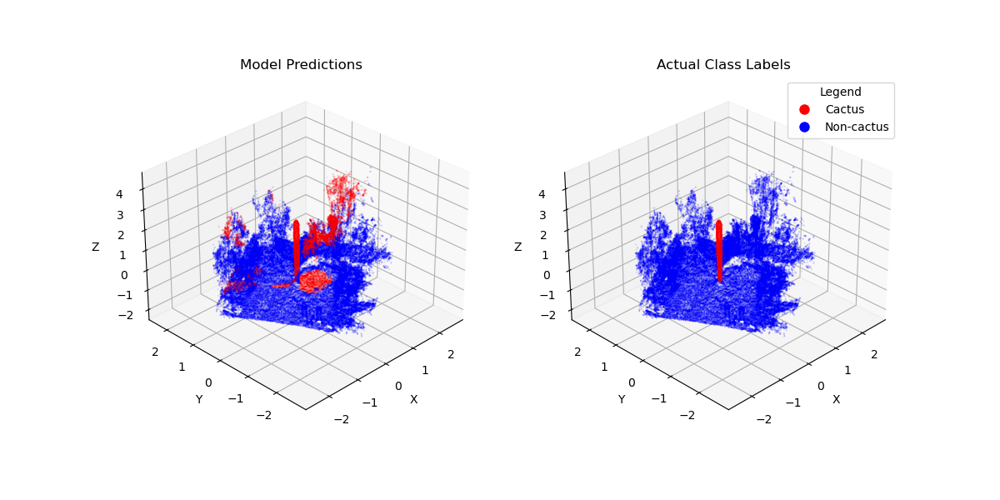

'Time elapsed:'

31.255438566207886

Epoch 1/5
90/90 [==============================] - 5s 42ms/step - loss: -6.7289 - accuracy: 0.9475 - recall_1: 0.5510 - val_loss: -57.5989 - val_accuracy: 0.9300 - val_recall_1: 0.9380
Epoch 2/5
90/90 [==============================] - 4s 40ms/step - loss: -127398.1641 - accuracy: 0.9224 - recall_1: 0.9463 - val_loss: -632749.0000 - val_accuracy: 0.9140 - val_recall_1: 0.9651
Epoch 3/5
90/90 [==============================] - 4s 40ms/step - loss: -46639912.0000 - accuracy: 0.9214 - recall_1: 0.9512 - val_loss: -121842640.0000 - val_accuracy: 0.9198 - val_recall_1: 0.9377
Epoch 4/5
90/90 [==============================] - 4s 39ms/step - loss: -2052865920.0000 - accuracy: 0.9214 - recall_1: 0.9520 - val_loss: -3998405632.0000 - val_accuracy: 0.9243 - val_recall_1: 0.9253
Epoch 5/5
3125/3125 [==============================] - 3s 1ms/step - loss: -49386168320.0000 - accuracy: 0.9096 - recall_1: 0.9324
Test accuracy: 0.9096199870109558
Test recall: 0.932441234588623
3125/3125 [=============

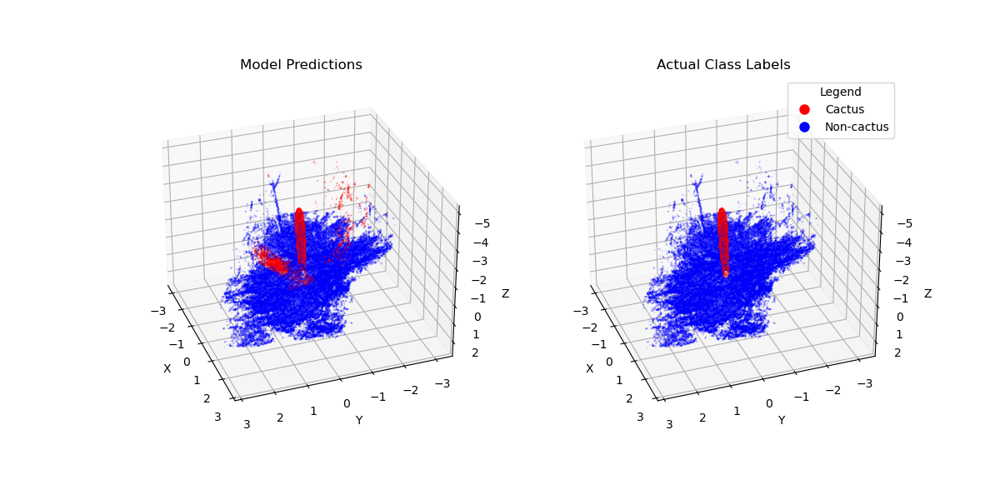

'Time elapsed:'

29.193516969680786

Epoch 1/5
90/90 [==============================] - 5s 41ms/step - loss: -7.1981 - accuracy: 0.9458 - recall_2: 0.5372 - val_loss: -98.8468 - val_accuracy: 0.9171 - val_recall_2: 0.9789
Epoch 2/5
90/90 [==============================] - 3s 39ms/step - loss: -151442.1719 - accuracy: 0.9199 - recall_2: 0.9380 - val_loss: -1437185.6250 - val_accuracy: 0.9239 - val_recall_2: 0.9865
Epoch 3/5
90/90 [==============================] - 4s 40ms/step - loss: -63478136.0000 - accuracy: 0.9197 - recall_2: 0.9423 - val_loss: -355243008.0000 - val_accuracy: 0.9165 - val_recall_2: 0.9888
Epoch 4/5
90/90 [==============================] - 4s 40ms/step - loss: -2828897024.0000 - accuracy: 0.9191 - recall_2: 0.9431 - val_loss: -10523304960.0000 - val_accuracy: 0.9133 - val_recall_2: 0.9891
Epoch 5/5
3125/3125 [==============================] - 3s 1ms/step - loss: -123139096576.0000 - accuracy: 0.9112 - recall_2: 0.9901
Test accuracy: 0.9111800193786621
Test recall: 0.9901022911071777
3125/3125 [=========

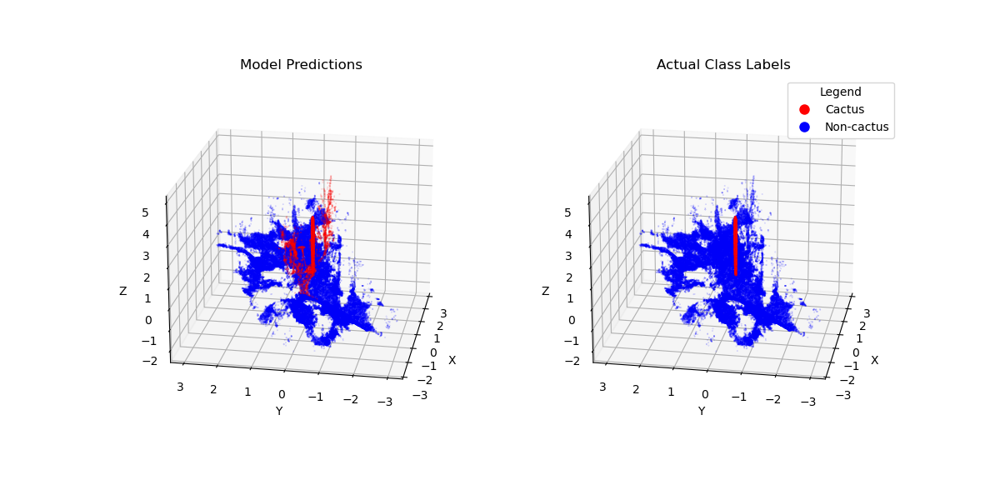

'Time elapsed:'

29.02537250518799

Epoch 1/5
90/90 [==============================] - 5s 41ms/step - loss: -13.5955 - accuracy: 0.9368 - recall_3: 0.5857 - val_loss: -96.3569 - val_accuracy: 0.9526 - val_recall_3: 0.7126
Epoch 2/5
90/90 [==============================] - 4s 39ms/step - loss: -315978.1875 - accuracy: 0.9223 - recall_3: 0.9555 - val_loss: -422325.5000 - val_accuracy: 0.9508 - val_recall_3: 0.6582
Epoch 3/5
90/90 [==============================] - 4s 39ms/step - loss: -97638072.0000 - accuracy: 0.9219 - recall_3: 0.9585 - val_loss: -53700808.0000 - val_accuracy: 0.9474 - val_recall_3: 0.6299
Epoch 4/5
90/90 [==============================] - 4s 41ms/step - loss: -4239653888.0000 - accuracy: 0.9218 - recall_3: 0.9582 - val_loss: -700518208.0000 - val_accuracy: 0.9497 - val_recall_3: 0.5830
Epoch 5/5
3125/3125 [==============================] - 3s 1ms/step - loss: -13227745280.0000 - accuracy: 0.9506 - recall_3: 0.5884
Test accuracy: 0.9505800008773804
Test recall: 0.5884353518486023
3125/3125 [=============

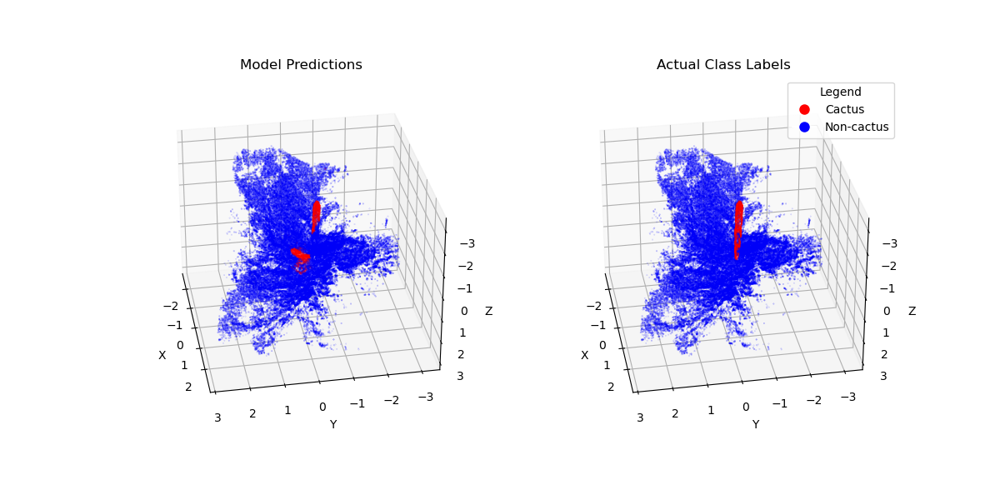

'Time elapsed:'

28.89876413345337

Epoch 1/5
90/90 [==============================] - 5s 41ms/step - loss: -3.4896 - accuracy: 0.9444 - recall_4: 0.5226 - val_loss: -0.9746 - val_accuracy: 0.8985 - val_recall_4: 0.8401
Epoch 2/5
90/90 [==============================] - 4s 39ms/step - loss: -113418.6250 - accuracy: 0.9200 - recall_4: 0.9155 - val_loss: -48634.4609 - val_accuracy: 0.9492 - val_recall_4: 0.7442
Epoch 3/5
90/90 [==============================] - 4s 42ms/step - loss: -42648244.0000 - accuracy: 0.9194 - recall_4: 0.9276 - val_loss: -23907012.0000 - val_accuracy: 0.9174 - val_recall_4: 0.9565
Epoch 4/5
90/90 [==============================] - 4s 41ms/step - loss: -1968498304.0000 - accuracy: 0.9193 - recall_4: 0.9340 - val_loss: -784277824.0000 - val_accuracy: 0.9481 - val_recall_4: 0.8959
Epoch 5/5
3125/3125 [==============================] - 3s 1ms/step - loss: -12283618304.0000 - accuracy: 0.9467 - recall_4: 0.9531
Test accuracy: 0.9466599822044373
Test recall: 0.9530612230300903
3125/3125 [================

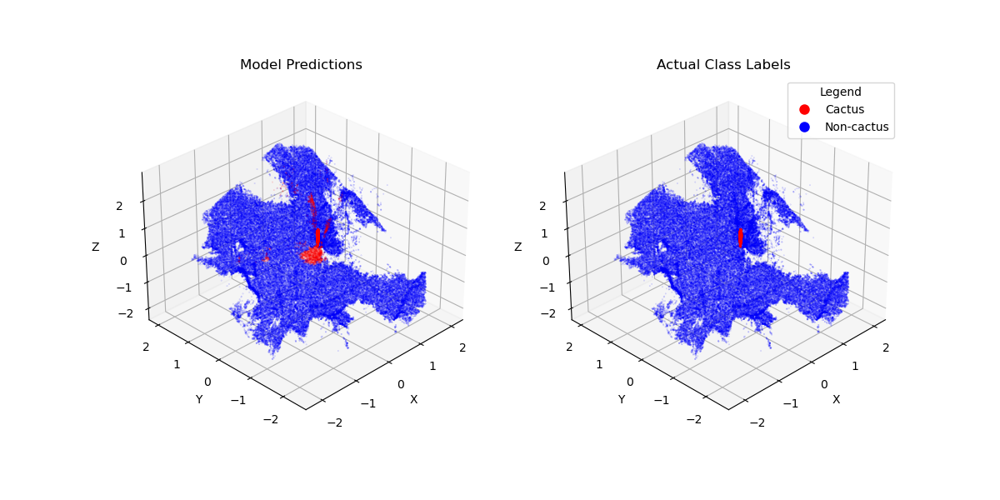

'Time elapsed:'

29.710554361343384

Epoch 1/5
90/90 [==============================] - 5s 46ms/step - loss: -5.3795 - accuracy: 0.9358 - recall_5: 0.5443 - val_loss: -67.5564 - val_accuracy: 0.9487 - val_recall_5: 0.8917
Epoch 2/5
90/90 [==============================] - 4s 42ms/step - loss: -157019.3438 - accuracy: 0.9213 - recall_5: 0.9369 - val_loss: -918648.2500 - val_accuracy: 0.9346 - val_recall_5: 0.9254
Epoch 3/5
90/90 [==============================] - 4s 46ms/step - loss: -53611676.0000 - accuracy: 0.9200 - recall_5: 0.9484 - val_loss: -201509408.0000 - val_accuracy: 0.9430 - val_recall_5: 0.9283
Epoch 4/5
90/90 [==============================] - 4s 45ms/step - loss: -2315315712.0000 - accuracy: 0.9200 - recall_5: 0.9489 - val_loss: -6685526528.0000 - val_accuracy: 0.9234 - val_recall_5: 0.9500
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: -73476407296.0000 - accuracy: 0.9277 - recall_5: 0.9439
Test accuracy: 0.9276599884033203
Test recall: 0.9438858032226562
3125/3125 [============

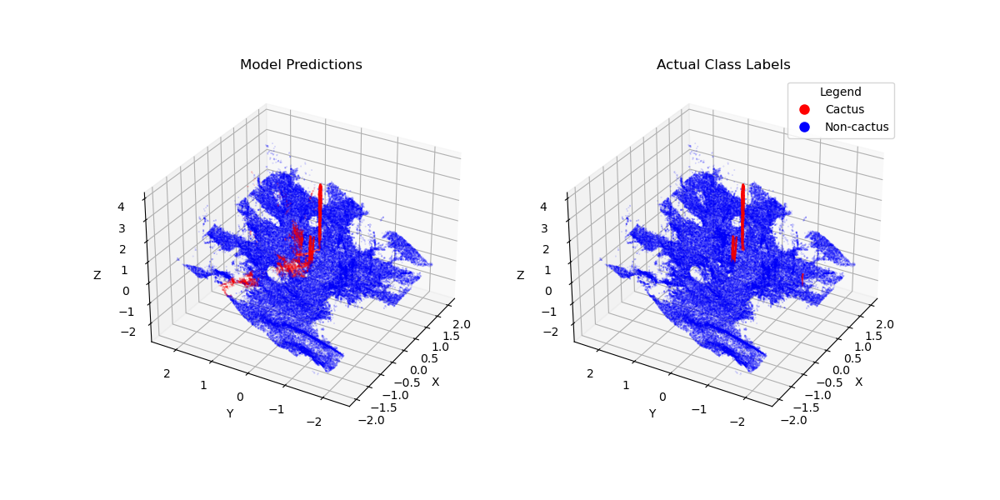

'Time elapsed:'

31.65293049812317

Epoch 1/5
90/90 [==============================] - 6s 51ms/step - loss: -49.7778 - accuracy: 0.9379 - recall_6: 0.6041 - val_loss: 2269.2629 - val_accuracy: 0.7585 - val_recall_6: 0.0288
Epoch 2/5
90/90 [==============================] - 4s 45ms/step - loss: -1014578.8125 - accuracy: 0.9274 - recall_6: 0.9612 - val_loss: 18536232.0000 - val_accuracy: 0.7392 - val_recall_6: 0.0275
Epoch 3/5
90/90 [==============================] - 4s 42ms/step - loss: -226514992.0000 - accuracy: 0.9255 - recall_6: 0.9599 - val_loss: 2553995520.0000 - val_accuracy: 0.7371 - val_recall_6: 0.0168
Epoch 4/5
90/90 [==============================] - 4s 42ms/step - loss: -7328986624.0000 - accuracy: 0.9254 - recall_6: 0.9562 - val_loss: 55958085632.0000 - val_accuracy: 0.7334 - val_recall_6: 0.0155
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: 602566230016.0000 - accuracy: 0.7189 - recall_6: 0.0152
Test accuracy: 0.7188900113105774
Test recall: 0.015200517140328884
3125/3125 [=====

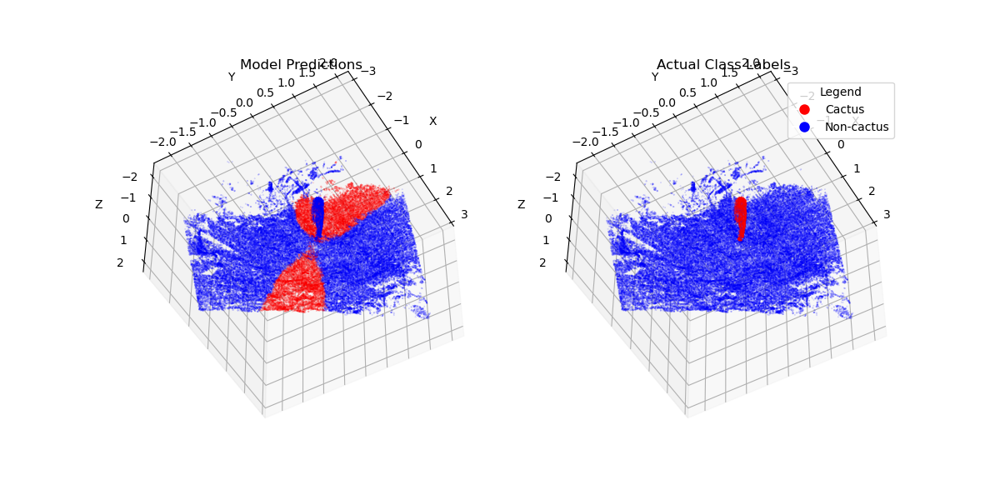

'Time elapsed:'

32.45387268066406

Epoch 1/5
90/90 [==============================] - 5s 47ms/step - loss: -3.7673 - accuracy: 0.9464 - recall_7: 0.5298 - val_loss: -67.1598 - val_accuracy: 0.9262 - val_recall_7: 0.9889
Epoch 2/5
90/90 [==============================] - 4s 42ms/step - loss: -113295.8047 - accuracy: 0.9198 - recall_7: 0.9301 - val_loss: -1096989.8750 - val_accuracy: 0.9310 - val_recall_7: 0.9866
Epoch 3/5
90/90 [==============================] - 4s 41ms/step - loss: -39760296.0000 - accuracy: 0.9195 - recall_7: 0.9409 - val_loss: -240275104.0000 - val_accuracy: 0.9115 - val_recall_7: 0.9915
Epoch 4/5
90/90 [==============================] - 4s 41ms/step - loss: -2002923520.0000 - accuracy: 0.9192 - recall_7: 0.9443 - val_loss: -8963628032.0000 - val_accuracy: 0.9238 - val_recall_7: 0.9896
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: -114150768640.0000 - accuracy: 0.9175 - recall_7: 0.9925
Test accuracy: 0.9175300002098083
Test recall: 0.9924958944320679
3125/3125 [==========

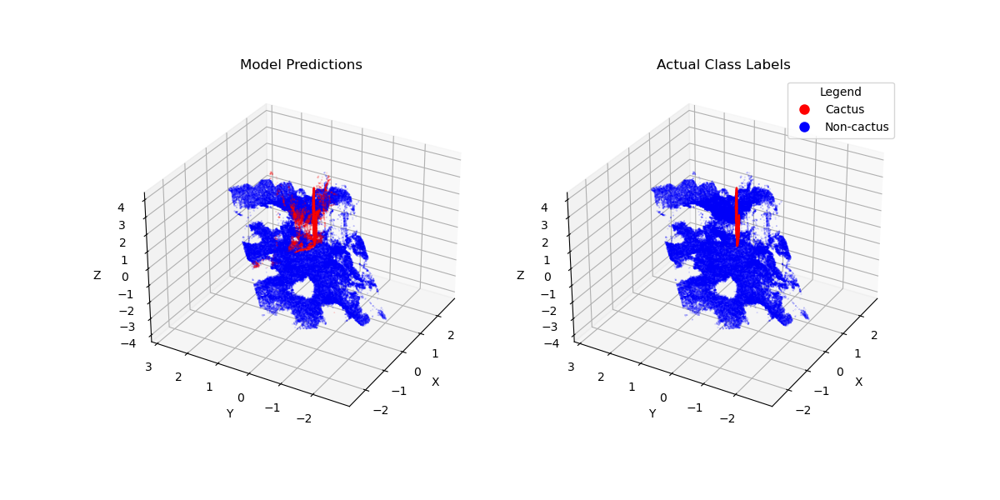

'Time elapsed:'

30.39998197555542

Epoch 1/5
90/90 [==============================] - 5s 44ms/step - loss: -0.6290 - accuracy: 0.9476 - recall_8: 0.4748 - val_loss: -13.4474 - val_accuracy: 0.9307 - val_recall_8: 0.9477
Epoch 2/5
90/90 [==============================] - 4s 42ms/step - loss: -54542.2891 - accuracy: 0.9187 - recall_8: 0.9179 - val_loss: -174924.4062 - val_accuracy: 0.8356 - val_recall_8: 0.9272
Epoch 3/5
90/90 [==============================] - 4s 41ms/step - loss: -35109744.0000 - accuracy: 0.9186 - recall_8: 0.9134 - val_loss: -83497960.0000 - val_accuracy: 0.8581 - val_recall_8: 0.9162
Epoch 4/5
90/90 [==============================] - 4s 41ms/step - loss: -2137645440.0000 - accuracy: 0.9186 - recall_8: 0.9121 - val_loss: -1812076032.0000 - val_accuracy: 0.7817 - val_recall_8: 0.9526
Epoch 5/5
3125/3125 [==============================] - 3s 1ms/step - loss: -13794751488.0000 - accuracy: 0.7895 - recall_8: 0.9370
Test accuracy: 0.7894979119300842
Test recall: 0.9369925260543823
3125/3125 [==============

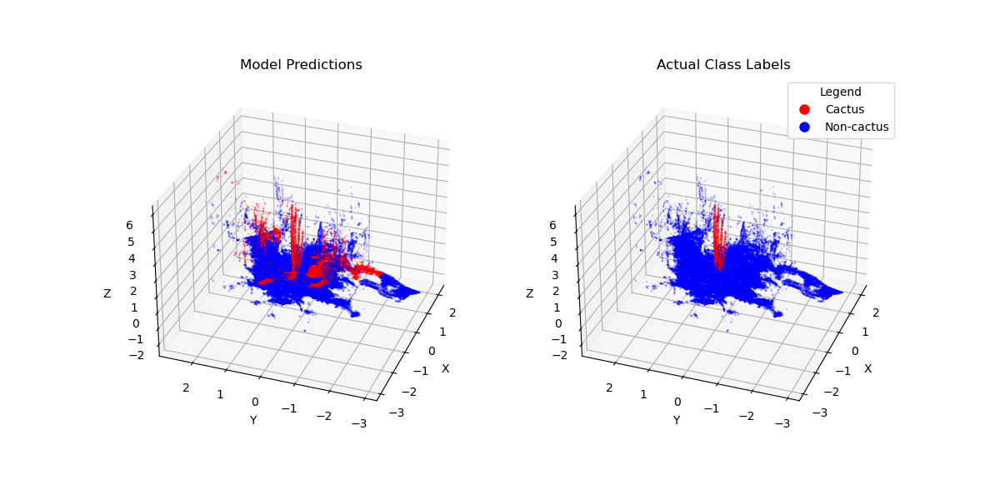

'Time elapsed:'

30.407779455184937

Epoch 1/5
90/90 [==============================] - 5s 43ms/step - loss: -34.0870 - accuracy: 0.9362 - recall_9: 0.5784 - val_loss: 153.3876 - val_accuracy: 0.9207 - val_recall_9: 0.5552
Epoch 2/5
90/90 [==============================] - 4s 43ms/step - loss: -628449.8125 - accuracy: 0.9236 - recall_9: 0.9383 - val_loss: 1338678.1250 - val_accuracy: 0.9221 - val_recall_9: 0.5358
Epoch 3/5
90/90 [==============================] - 4s 42ms/step - loss: -154058272.0000 - accuracy: 0.9230 - recall_9: 0.9425 - val_loss: 191527088.0000 - val_accuracy: 0.9072 - val_recall_9: 0.6293
Epoch 4/5
90/90 [==============================] - 4s 42ms/step - loss: -5847968256.0000 - accuracy: 0.9225 - recall_9: 0.9444 - val_loss: 4883530752.0000 - val_accuracy: 0.9123 - val_recall_9: 0.6205
Epoch 5/5
3125/3125 [==============================] - 3s 1ms/step - loss: 56030130176.0000 - accuracy: 0.8978 - recall_9: 0.6201
Test accuracy: 0.8977689743041992
Test recall: 0.6201155185699463
3125/3125 [=============

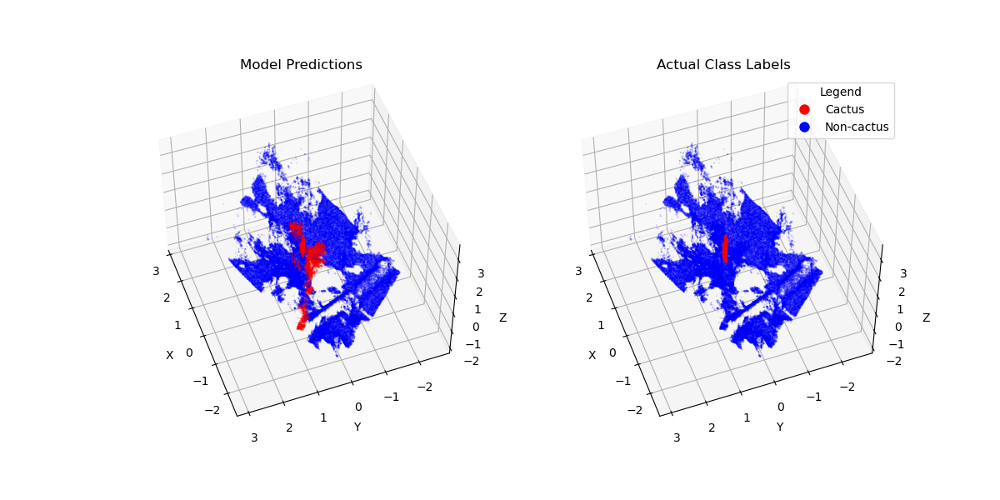

'Time elapsed:'

30.743947744369507

Accuracies: [0.8464199900627136, 0.9096199870109558, 0.9111800193786621, 0.9505800008773804, 0.9466599822044373, 0.9276599884033203, 0.7188900113105774, 0.9175300002098083, 0.7894979119300842, 0.8977689743041992]
Recalls: [0.9381031394004822, 0.932441234588623, 0.9901022911071777, 0.5884353518486023, 0.9530612230300903, 0.9438858032226562, 0.015200517140328884, 0.9924958944320679, 0.9369925260543823, 0.6201155185699463]


In [3]:
# This cell is all about taking the preprocessed data and building the best MLP model for this binary classification task

import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Input, Dense, Conv1D, BatchNormalization, MaxPooling1D, Flatten, GlobalMaxPooling1D
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from matplotlib.lines import Line2D

# ExportPointCloudLAS - takes in a point cloud dataframe ('pc_df') with XYZ and RGB values (in range [0,1]), and then exports it to a .las file at 'filepath'
def ExportPointCloudLAS(pc_df, filepath):    
    # Create a new LAS file
    header = laspy.LasHeader(point_format=2, version="1.2")
    outfile = laspy.LasData(header)

    # Assign coordinates
    outfile.x = pc_df['X'].astype(float)
    outfile.y = pc_df['Y'].astype(float)
    outfile.z = pc_df['Z'].astype(float)

    # Assign colors, scaling required as LAS expects 16-bit colors
    outfile.red = (pc_df['red']).astype('uint16')
    outfile.green = (pc_df['green']).astype('uint16')
    outfile.blue = (pc_df['blue']).astype('uint16')

    # Write the LAS file
    outfile.write(filepath)
                  
# ExportPointCloudXYZ - takes in a point cloud dataframe ('pc_df') with XYZ values and then exports it to a .xyz file at 'filepath'
def ExportPointCloudXYZ(pc_df, filepath):    
    with open(filepath, 'w') as file:
        for index, row in pc_df.iterrows():
            file.write(f"{row['X']} {row['Y']} {row['Z']}\n")


def MLPModel():    
    # Simple multilayer perceptron (MLP) model which only has Dense layers 
    input_shape = (6,)
    model = tf.keras.Sequential([
        Dense(64, activation='relu', input_shape=input_shape),
        Dense(128, activation='relu'),
        Dense(256, activation='relu'),
        Dense(512, activation='relu'),
        Dense(256, activation='relu'),
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(1, activation='sigmoid')  # Binary classification output
    ])
    
    # Show the model
    # model.summary()

    # Compile the model using accuracy and recall as the main metrics
    # Recall represents how much of the cactus the model can identify and accuracy represents how much of the other terrain and vegetation the model can rule out
    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy', tf.keras.metrics.Recall()])
    
    return model

# Get point clouds into an array for K-fold cross validation
dfs = [df_cg_01, df_cg_02, df_cg_03, df_cg_04, df_cg_05, df_op_01, df_op_02, df_op_03, df_op_04, df_op_05]
scalers = [cg_01_scaler, cg_02_scaler, cg_03_scaler, cg_04_scaler, cg_05_scaler, op_01_scaler, op_02_scaler, op_03_scaler, op_04_scaler, op_05_scaler]

# Do 10-fold cross validation, as we have 10 point clouds to work with
# CreateModelFunc parameter allows the use of different CreateModel functions
def KFCV(dfs, scalers, CreateModelFunc, do_export = False, epochs = 5, batch_size = 64): # KFCV = k-fold cross-validation
    # Use these elev and azim values for the corresponding point cloud for plotting
    elev = [30, 210, 20, 210, 30, 30, 130, 30, 30, 50]
    azim = [225, 200, 190, 190, 225, 210, 330, 210, 200, 160]

    # Arrays to store accuracy and recall values from each of the iterations
    accuracies = []
    recalls = []

    drop_index = 0
    for df in dfs:
        # Record how much time each loop takes
        start = time.time()

        # Get the data into training and testing sets
        # Use the current 'df' as the test set
        X_test = df[['X', 'Y', 'Z', 'red', 'green', 'blue']]
        y_test = df[['classification']]

        # Use the remaining 9 dfs as the training set, giving a train-test split of 90-10
        train = dfs.copy()
        del train[drop_index]

        train_df = pandas.concat(train[:])
        X_train = train_df[['X', 'Y', 'Z', 'red', 'green', 'blue']]
        y_train = train_df[['classification']]    

        # Define the MLP model
        model = CreateModelFunc()

        # Train the model
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test, y_test))

        # Evaluate the model
        test_loss, test_acc, test_recall = model.evaluate(X_test, y_test)
        print('Test accuracy:', test_acc)
        print('Test recall:', test_recall)
        accuracies.append(test_acc)
        recalls.append(test_recall)

        # Use the model for prediction and show results
        predictions = model.predict(X_test)
        predictions = (predictions > 0.5).astype(int) # set probablity values to 0 or 1 integers
        y_test = y_test.replace(range(2, 11), 1) # make sure positive labels are set to 1 here because that is what the classification_report function expects
        print(classification_report(y_test, predictions))

        # Create a 3D scatter plot for the predicted classes
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(121, projection='3d')
        ax.view_init(elev=elev[drop_index], azim=azim[drop_index])
        scatter = ax.scatter(X_test['X'], X_test['Y'], X_test['Z'], 
                             c=predictions, cmap='bwr',
                             marker='o', alpha=0.3, s=0.05)
        ax.set_title('Model Predictions')
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')

        # Create a 3D scatter plot for the actual classes
        ax = fig.add_subplot(122, projection='3d')
        ax.view_init(elev=elev[drop_index], azim=azim[drop_index])
        scatter = ax.scatter(X_test['X'], X_test['Y'], X_test['Z'], 
                             c=y_test, cmap='bwr',
                             marker='o', alpha=0.3, s=0.05)
        ax.set_title('Actual Class Labels')
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')

        legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor='r', markersize=10, label='Cactus'),
                       Line2D([0], [0], marker='o', color='w', markerfacecolor='b', markersize=10, label='Non-cactus')]
        ax.legend(handles=legend_elements, title="Legend")


        # Show the plot
        plt.show()

        # Export predicted cactus point cloud
        if do_export:          
            # Add back in the 'classification' column (with placeholder 0s) to make the inverse_transform function happy
            X_test['classification'] = 0
            X_test = pandas.DataFrame(scalers[drop_index].inverse_transform(X_test), columns=X_test.columns)
            
            # Set 'classification' column to real predicted values
            X_test['classification'] = predictions

            # Filter out points which are not 'cactus' points
            X_test = X_test[X_test['classification'] != 0]
            # display(X_test)

            if drop_index <= 4:
                # CG point clouds
                ExportPointCloudLAS(X_test, "./Model_Predictions/{}_Predicted_CG0{}.las".format(CreateModelFunc.__name__, drop_index + 1))
                ExportPointCloudXYZ(X_test, "./Model_Predictions/{}_Predicted_CG0{}.xyz".format(CreateModelFunc.__name__, drop_index + 1))
            else:
                # OP point clouds
                ExportPointCloudLAS(X_test, "./Model_Predictions/{}_Predicted_OP0{}.las".format(CreateModelFunc.__name__, drop_index - 4))
                ExportPointCloudXYZ(X_test, "./Model_Predictions/{}_Predicted_OP0{}.xyz".format(CreateModelFunc.__name__, drop_index - 4))           

        # Increment index to go on to next point cloud and display the elapsed time for this loop
        drop_index += 1
        display("Time elapsed:", time.time() - start)

        # Uncomment this to just run one loop for testing
        # break

    print("Accuracies:", accuracies)
    print("Recalls:", recalls)
    
# Call the k-fold cross-validation function with the MLP model function
KFCV(dfs, scalers, MLPModel, do_export=True, epochs=5, batch_size=10000)


Epoch 1/5
90/90 [==============================] - 14s 141ms/step - loss: 0.2051 - accuracy: 0.9615 - recall_10: 0.2194 - val_loss: -0.0676 - val_accuracy: 0.9138 - val_recall_10: 0.9012
Epoch 2/5
90/90 [==============================] - 12s 132ms/step - loss: -355.2145 - accuracy: 0.9159 - recall_10: 0.9061 - val_loss: -823.3276 - val_accuracy: 0.8694 - val_recall_10: 0.9055
Epoch 3/5
90/90 [==============================] - 12s 131ms/step - loss: -109928.1484 - accuracy: 0.9151 - recall_10: 0.9125 - val_loss: -62362.7891 - val_accuracy: 0.8402 - val_recall_10: 0.9318
Epoch 4/5
90/90 [==============================] - 12s 134ms/step - loss: -4888129.0000 - accuracy: 0.9144 - recall_10: 0.9171 - val_loss: -2709993.0000 - val_accuracy: 0.8487 - val_recall_10: 0.9248
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: -56956556.0000 - accuracy: 0.8614 - recall_10: 0.9185
Test accuracy: 0.8613799810409546
Test recall: 0.9184691905975342
3125/3125 [=================

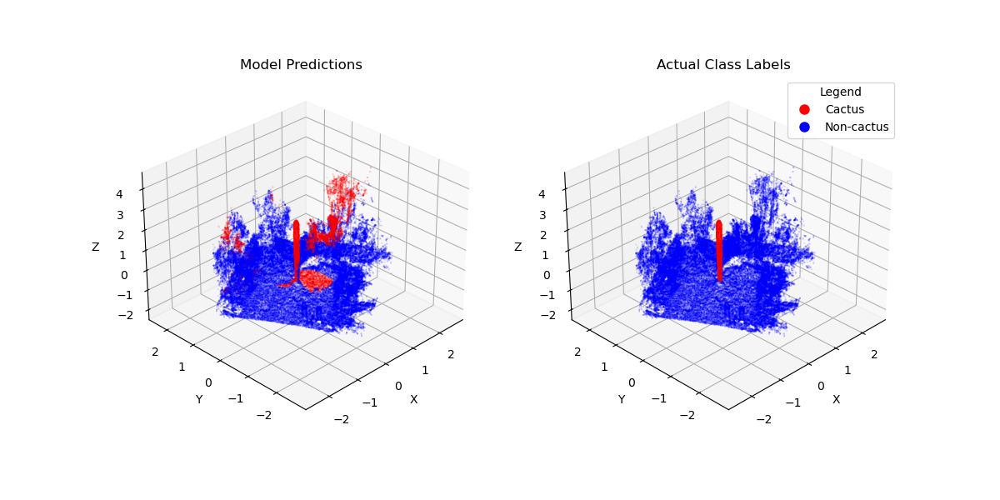

'Time elapsed:'

72.54871392250061

Epoch 1/5
90/90 [==============================] - 13s 129ms/step - loss: 0.2306 - accuracy: 0.9563 - recall_11: 0.1251 - val_loss: 0.1211 - val_accuracy: 0.9405 - val_recall_11: 0.4488
Epoch 2/5
90/90 [==============================] - 12s 136ms/step - loss: -56.7346 - accuracy: 0.9215 - recall_11: 0.9242 - val_loss: -355.6469 - val_accuracy: 0.8559 - val_recall_11: 0.9958
Epoch 3/5
90/90 [==============================] - 13s 139ms/step - loss: -27458.1914 - accuracy: 0.9174 - recall_11: 0.9385 - val_loss: -111325.9531 - val_accuracy: 0.8908 - val_recall_11: 0.9749
Epoch 4/5
90/90 [==============================] - 12s 135ms/step - loss: -1631842.2500 - accuracy: 0.9173 - recall_11: 0.9425 - val_loss: -4413095.5000 - val_accuracy: 0.8916 - val_recall_11: 0.9742
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: -52132256.0000 - accuracy: 0.8904 - recall_11: 0.9742
Test accuracy: 0.8903999924659729
Test recall: 0.9742166996002197
3125/3125 [====================

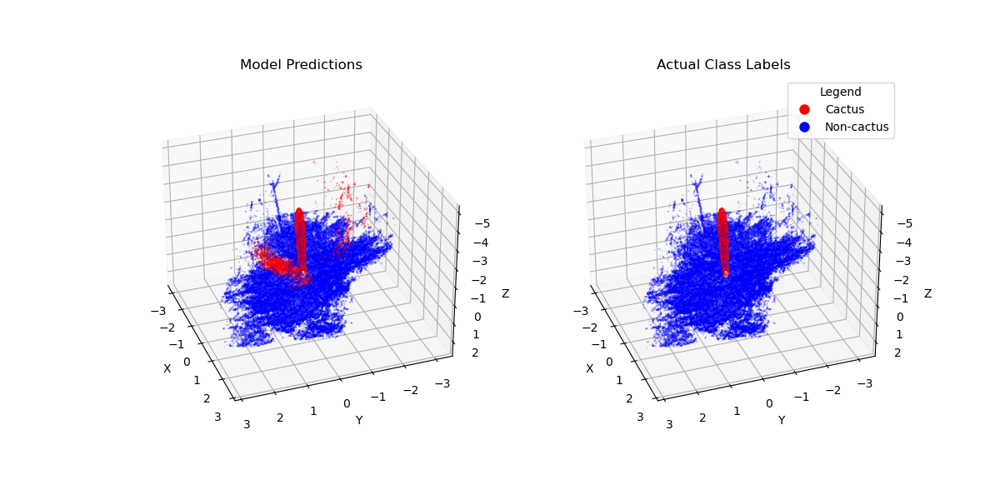

'Time elapsed:'

72.77571988105774

Epoch 1/5
90/90 [==============================] - 13s 133ms/step - loss: 0.2175 - accuracy: 0.9619 - recall_12: 0.1814 - val_loss: -0.0090 - val_accuracy: 0.9090 - val_recall_12: 0.9871
Epoch 2/5
90/90 [==============================] - 12s 131ms/step - loss: -124.7139 - accuracy: 0.9190 - recall_12: 0.9000 - val_loss: -1027.8652 - val_accuracy: 0.9079 - val_recall_12: 0.9908
Epoch 3/5
90/90 [==============================] - 12s 129ms/step - loss: -69733.3281 - accuracy: 0.9170 - recall_12: 0.9250 - val_loss: -403265.4688 - val_accuracy: 0.9025 - val_recall_12: 0.9937
Epoch 4/5
90/90 [==============================] - 12s 131ms/step - loss: -3047317.7500 - accuracy: 0.9163 - recall_12: 0.9282 - val_loss: -11198472.0000 - val_accuracy: 0.9087 - val_recall_12: 0.9898
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: -128378984.0000 - accuracy: 0.9094 - recall_12: 0.9908
Test accuracy: 0.9094499945640564
Test recall: 0.9907621145248413
3125/3125 [===============

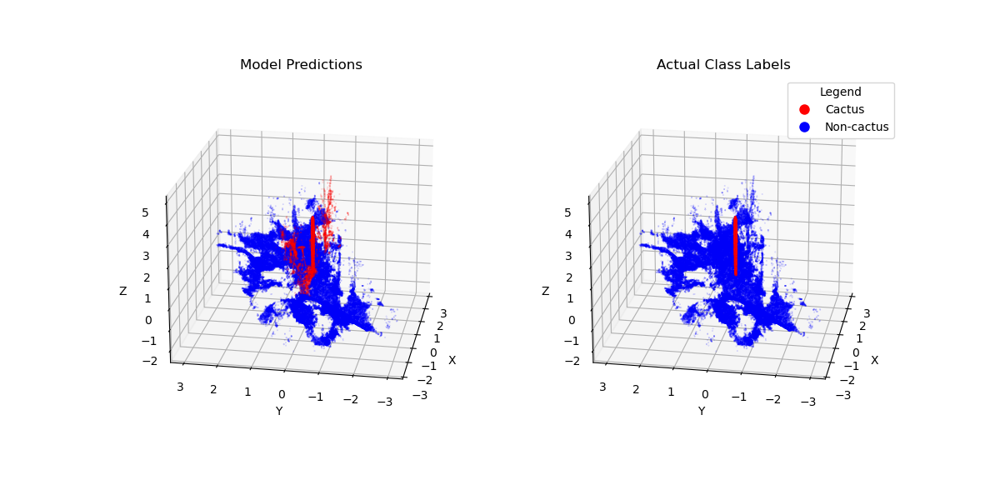

'Time elapsed:'

71.42164850234985

Epoch 1/5
90/90 [==============================] - 13s 130ms/step - loss: 0.1916 - accuracy: 0.9648 - recall_13: 0.1870 - val_loss: 0.1861 - val_accuracy: 0.9528 - val_recall_13: 0.2395
Epoch 2/5
90/90 [==============================] - 12s 129ms/step - loss: -42.2112 - accuracy: 0.9226 - recall_13: 0.9352 - val_loss: -101.2767 - val_accuracy: 0.9542 - val_recall_13: 0.6854
Epoch 3/5
90/90 [==============================] - 12s 129ms/step - loss: -23498.7402 - accuracy: 0.9183 - recall_13: 0.9526 - val_loss: -43500.6992 - val_accuracy: 0.9449 - val_recall_13: 0.7007
Epoch 4/5
90/90 [==============================] - 12s 129ms/step - loss: -1334252.0000 - accuracy: 0.9181 - recall_13: 0.9569 - val_loss: -1281507.3750 - val_accuracy: 0.9435 - val_recall_13: 0.6908
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: -10377162.0000 - accuracy: 0.9495 - recall_13: 0.6707
Test accuracy: 0.9494500160217285
Test recall: 0.6707482933998108
3125/3125 [=====================

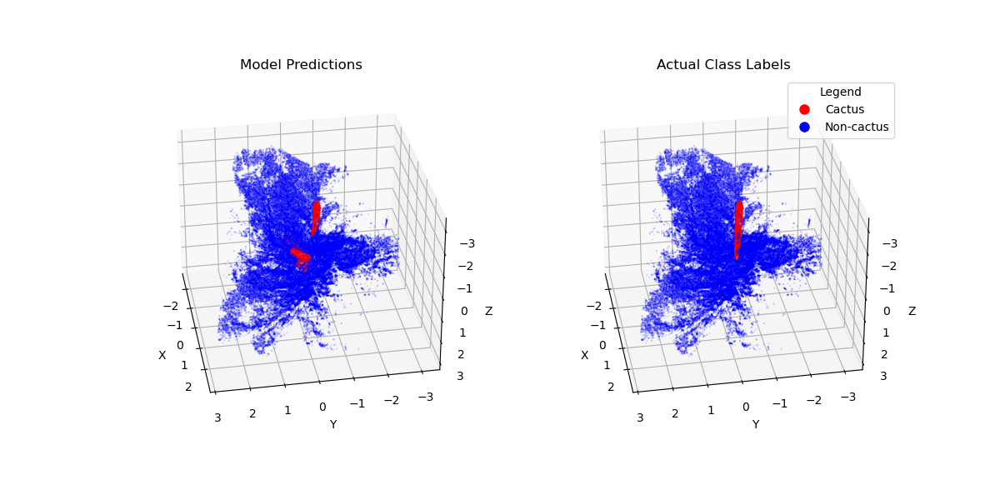

'Time elapsed:'

70.30711007118225

Epoch 1/5
90/90 [==============================] - 13s 132ms/step - loss: 0.2325 - accuracy: 0.9586 - recall_14: 0.0938 - val_loss: 0.0863 - val_accuracy: 0.9551 - val_recall_14: 0.3704
Epoch 2/5
90/90 [==============================] - 12s 130ms/step - loss: -85.7910 - accuracy: 0.9221 - recall_14: 0.8967 - val_loss: 169.6078 - val_accuracy: 0.9548 - val_recall_14: 0.2078
Epoch 3/5
90/90 [==============================] - 12s 130ms/step - loss: -56031.1602 - accuracy: 0.9176 - recall_14: 0.9108 - val_loss: 7698.7778 - val_accuracy: 0.9470 - val_recall_14: 0.6116
Epoch 4/5
90/90 [==============================] - 12s 131ms/step - loss: -3328922.2500 - accuracy: 0.9174 - recall_14: 0.9146 - val_loss: -436015.4375 - val_accuracy: 0.9432 - val_recall_14: 0.8612
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: -2133957.2500 - accuracy: 0.9521 - recall_14: 0.7289
Test accuracy: 0.9520999789237976
Test recall: 0.7289115786552429
3125/3125 [==========================

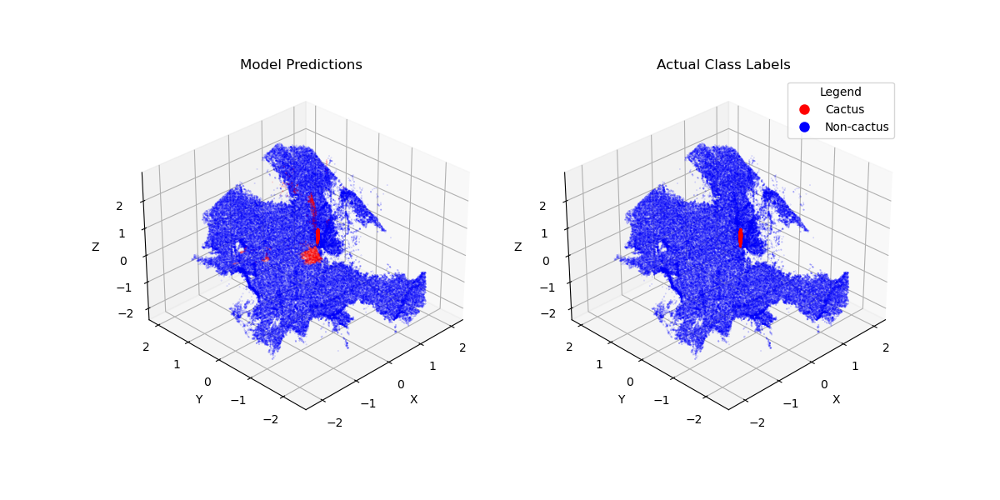

'Time elapsed:'

71.49623489379883

Epoch 1/5
90/90 [==============================] - 13s 131ms/step - loss: 0.2136 - accuracy: 0.9599 - recall_15: 0.1605 - val_loss: 0.1299 - val_accuracy: 0.9416 - val_recall_15: 0.3999
Epoch 2/5
90/90 [==============================] - 12s 131ms/step - loss: -201.7238 - accuracy: 0.9197 - recall_15: 0.9121 - val_loss: -1589.4686 - val_accuracy: 0.9160 - val_recall_15: 0.9520
Epoch 3/5
90/90 [==============================] - 12s 130ms/step - loss: -116973.8516 - accuracy: 0.9161 - recall_15: 0.9280 - val_loss: -487523.2188 - val_accuracy: 0.9389 - val_recall_15: 0.9241
Epoch 4/5
90/90 [==============================] - 12s 128ms/step - loss: -5664143.0000 - accuracy: 0.9165 - recall_15: 0.9323 - val_loss: -15877584.0000 - val_accuracy: 0.9388 - val_recall_15: 0.9280
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: -169232496.0000 - accuracy: 0.9420 - recall_15: 0.9179
Test accuracy: 0.9419900178909302
Test recall: 0.9179370999336243
3125/3125 [===============

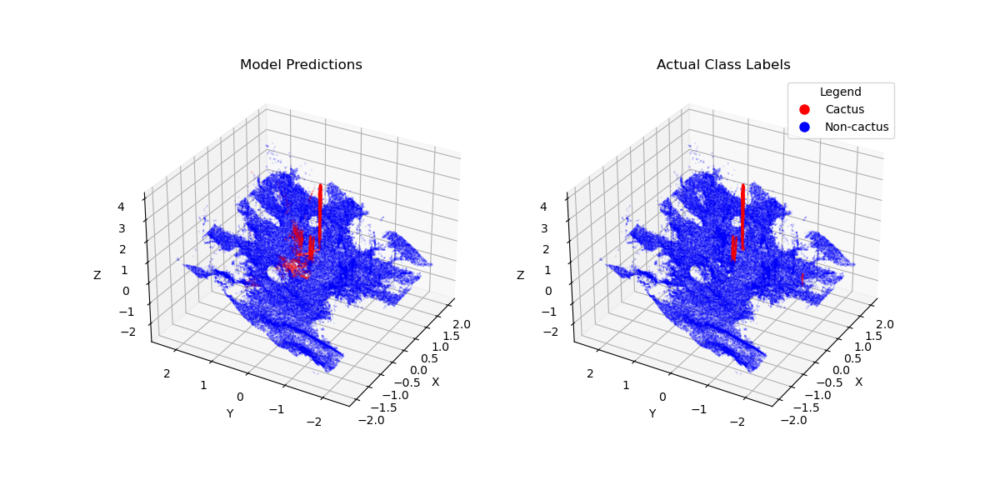

'Time elapsed:'

70.8453688621521

Epoch 1/5
90/90 [==============================] - 13s 132ms/step - loss: 0.2050 - accuracy: 0.9534 - recall_16: 0.2330 - val_loss: 2.5641 - val_accuracy: 0.8132 - val_recall_16: 0.0365
Epoch 2/5
90/90 [==============================] - 12s 130ms/step - loss: -1961.3856 - accuracy: 0.9225 - recall_16: 0.9512 - val_loss: 68601.4688 - val_accuracy: 0.6549 - val_recall_16: 0.0815
Epoch 3/5
90/90 [==============================] - 12s 134ms/step - loss: -495977.7188 - accuracy: 0.9200 - recall_16: 0.9575 - val_loss: 8014430.0000 - val_accuracy: 0.6896 - val_recall_16: 0.0579
Epoch 4/5
90/90 [==============================] - 12s 132ms/step - loss: -14670241.0000 - accuracy: 0.9194 - recall_16: 0.9567 - val_loss: 200372928.0000 - val_accuracy: 0.6390 - val_recall_16: 0.0818
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: 1716500736.0000 - accuracy: 0.6499 - recall_16: 0.0741
Test accuracy: 0.649869978427887
Test recall: 0.07406209409236908
3125/3125 [=============

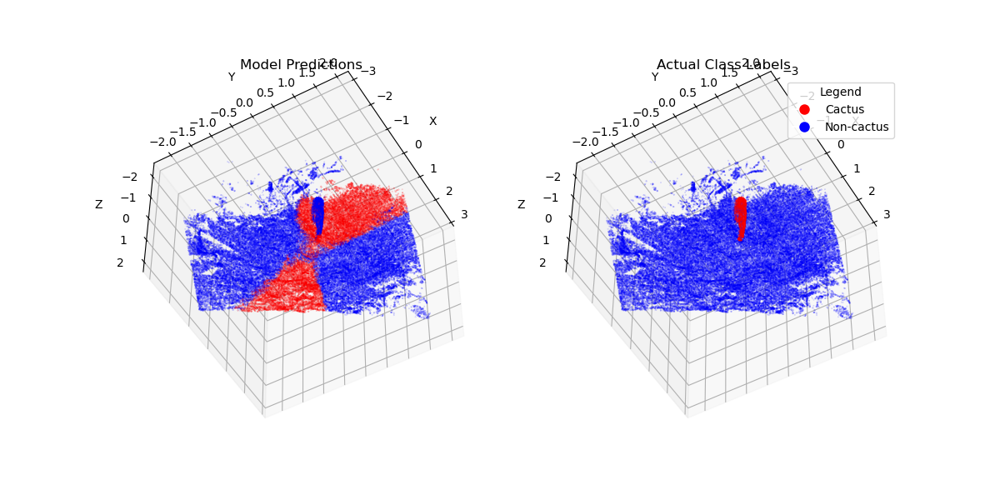

'Time elapsed:'

72.4495906829834

Epoch 1/5
90/90 [==============================] - 13s 133ms/step - loss: 0.1963 - accuracy: 0.9635 - recall_17: 0.2127 - val_loss: 0.0147 - val_accuracy: 0.9410 - val_recall_17: 0.9804
Epoch 2/5
90/90 [==============================] - 12s 132ms/step - loss: -47.1585 - accuracy: 0.9206 - recall_17: 0.9072 - val_loss: -384.4778 - val_accuracy: 0.9339 - val_recall_17: 0.9726
Epoch 3/5
90/90 [==============================] - 12s 131ms/step - loss: -22562.9453 - accuracy: 0.9172 - recall_17: 0.9199 - val_loss: -134691.2031 - val_accuracy: 0.9188 - val_recall_17: 0.9918
Epoch 4/5
90/90 [==============================] - 12s 129ms/step - loss: -1129709.0000 - accuracy: 0.9167 - recall_17: 0.9266 - val_loss: -3952568.2500 - val_accuracy: 0.9289 - val_recall_17: 0.9808
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: -47183944.0000 - accuracy: 0.9174 - recall_17: 0.9935
Test accuracy: 0.9173700213432312
Test recall: 0.9934747219085693
3125/3125 [====================

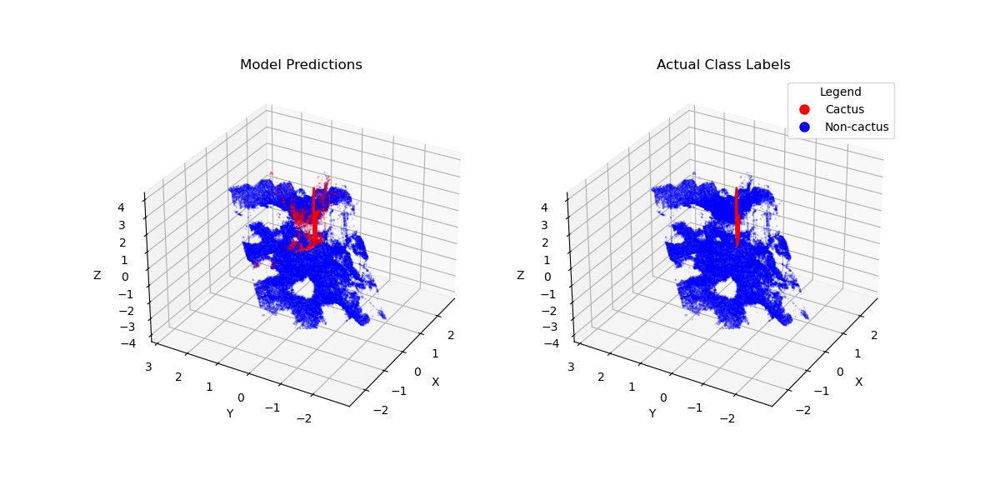

'Time elapsed:'

71.52624845504761

Epoch 1/5
90/90 [==============================] - 13s 134ms/step - loss: 0.2445 - accuracy: 0.9534 - recall_18: 0.1676 - val_loss: -0.1652 - val_accuracy: 0.9392 - val_recall_18: 0.9341
Epoch 2/5
90/90 [==============================] - 12s 131ms/step - loss: -469.1194 - accuracy: 0.9165 - recall_18: 0.8978 - val_loss: -2634.6768 - val_accuracy: 0.8268 - val_recall_18: 0.9506
Epoch 3/5
90/90 [==============================] - 12s 132ms/step - loss: -138293.4531 - accuracy: 0.9154 - recall_18: 0.9084 - val_loss: -434973.7188 - val_accuracy: 0.8340 - val_recall_18: 0.9315
Epoch 4/5
90/90 [==============================] - 12s 132ms/step - loss: -5042984.0000 - accuracy: 0.9157 - recall_18: 0.9140 - val_loss: -12695871.0000 - val_accuracy: 0.8493 - val_recall_18: 0.9117
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: -110108944.0000 - accuracy: 0.8343 - recall_18: 0.9133
Test accuracy: 0.8342983722686768
Test recall: 0.9132835268974304
3125/3125 [==============

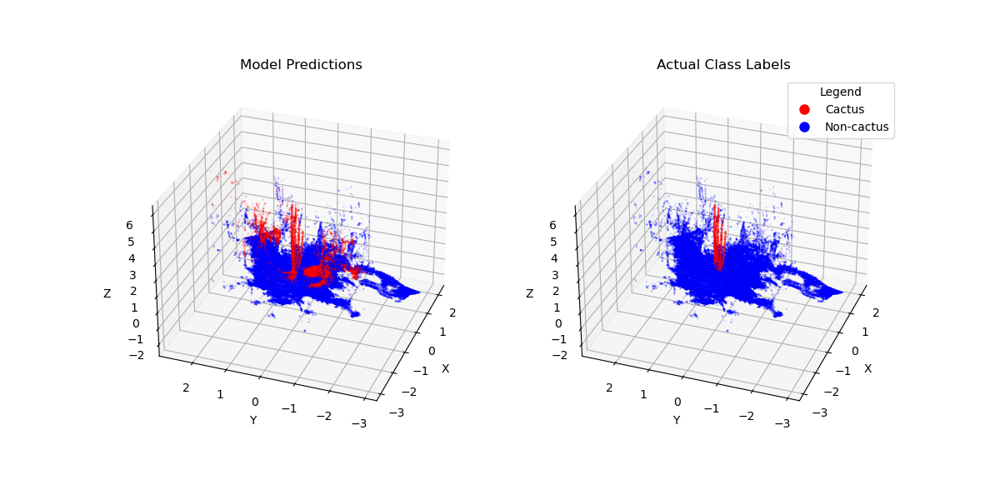

'Time elapsed:'

72.07858633995056

Epoch 1/5
90/90 [==============================] - 13s 133ms/step - loss: 0.2143 - accuracy: 0.9536 - recall_19: 0.1918 - val_loss: 0.2875 - val_accuracy: 0.9308 - val_recall_19: 0.2888
Epoch 2/5
90/90 [==============================] - 12s 131ms/step - loss: -1056.6733 - accuracy: 0.9203 - recall_19: 0.9357 - val_loss: 2258.1082 - val_accuracy: 0.9139 - val_recall_19: 0.5647
Epoch 3/5
90/90 [==============================] - 12s 132ms/step - loss: -294904.9062 - accuracy: 0.9177 - recall_19: 0.9446 - val_loss: 285840.5312 - val_accuracy: 0.9133 - val_recall_19: 0.5756
Epoch 4/5
90/90 [==============================] - 12s 133ms/step - loss: -9204781.0000 - accuracy: 0.9176 - recall_19: 0.9476 - val_loss: 6332180.0000 - val_accuracy: 0.9117 - val_recall_19: 0.5936
Epoch 5/5
3125/3125 [==============================] - 4s 1ms/step - loss: 59129348.0000 - accuracy: 0.9131 - recall_19: 0.5810
Test accuracy: 0.9131491184234619
Test recall: 0.5810397267341614
3125/3125 [====================

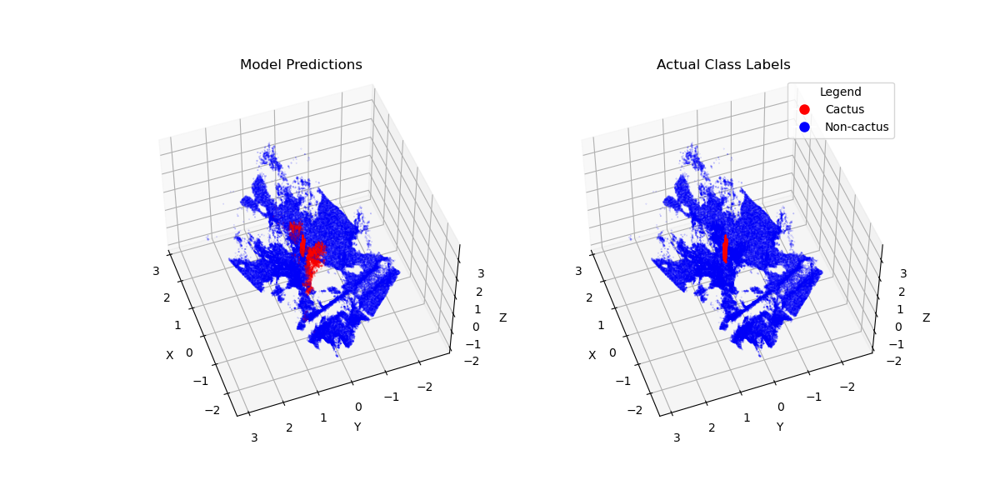

'Time elapsed:'

72.11983799934387

Accuracies: [0.8613799810409546, 0.8903999924659729, 0.9094499945640564, 0.9494500160217285, 0.9520999789237976, 0.9419900178909302, 0.649869978427887, 0.9173700213432312, 0.8342983722686768, 0.9131491184234619]
Recalls: [0.9184691905975342, 0.9742166996002197, 0.9907621145248413, 0.6707482933998108, 0.7289115786552429, 0.9179370999336243, 0.07406209409236908, 0.9934747219085693, 0.9132835268974304, 0.5810397267341614]


In [4]:
# This cell is all about taking the preprocessed data and building the best 1D CNN model for this binary classification task

def CNNModel():
    # Attempt at making a 2D convolutional network (failed in all attempts)
    # Kept getting errors about data not being the right shape, but no matter what I did I couldn't get it to work
    # input_shape = (100000, 6, 1)
    # model = tf.keras.Sequential([
    #     tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=input_shape),
    #     tf.keras.layers.MaxPooling2D((2, 2), padding='same'),
    #     tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    #     tf.keras.layers.MaxPooling2D((2, 2), padding='same'),
    #     tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    #     tf.keras.layers.MaxPooling2D((2, 2), padding='same'),
    #     tf.keras.layers.Flatten(),
    #     tf.keras.layers.Dense(3, activation='relu'),
    #     tf.keras.layers.Dense(1, activation='sigmoid')
    # ])

    # Attempts at making 1D convolutional networks where the convolution is performed using neighboring points 
    # NOTE: 'neighboring' here does not mean spatial proximity, but only proximity in how the points are randomly ordered in the data structure
    input_shape = (6, 1)
    model = tf.keras.Sequential([
        # Attempt 1
        Conv1D(filters=64, kernel_size=25, activation='relu', padding='same', input_shape=input_shape),
        MaxPooling1D(pool_size=2, padding='same'),
        Conv1D(128, 13, activation='relu', padding='same'),
        MaxPooling1D(pool_size=2, padding='same'),
        Conv1D(256, 7, activation='relu', padding='same'),
        GlobalMaxPooling1D(),
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
        
        # Attempt 2
        # Conv1D(filters=64, kernel_size=1, activation='relu', padding='same', input_shape=input_shape),
        # Conv1D(128, 1, activation='relu', padding='same'),
        # Conv1D(256, 1, activation='relu', padding='same'),
        # GlobalMaxPooling1D(),
        # Dense(256, activation='relu'),
        # Dense(128, activation='relu'),
        # Dense(64, activation='relu'),
        # Dense(1, activation='sigmoid')
        
        # Attempt 3
        # Conv1D(filters=64, kernel_size=1, activation='relu', padding='same', input_shape=input_shape),
        # BatchNormalization(),
        # Conv1D(128, 1, activation='relu', padding='same'),
        # BatchNormalization(),
        # Conv1D(256, 1, activation='relu', padding='same'),
        # BatchNormalization(),
        # GlobalMaxPooling1D(),
        # Dense(256, activation='relu'),
        # BatchNormalization(),
        # Dense(64, activation='relu'),
        # BatchNormalization(),
        # Dense(16, activation='relu'),
        # BatchNormalization(),
        # Dense(1, activation='sigmoid')
        
        # Attempt 4 - based on PointNet
        # Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=input_shape),
        # BatchNormalization(),
        # Conv1D(128, 1, activation='relu'),
        # BatchNormalization(),
        # Conv1D(1024, 1, activation='relu'),
        # BatchNormalization(),
        # GlobalMaxPooling1D(),
        # Dense(512, activation='relu'),
        # BatchNormalization(),
        # Dense(256, activation='relu'),
        # BatchNormalization(),
        # Dense(128, activation='relu'),
        # BatchNormalization(),
        # Dense(1, activation='sigmoid')
    ])
    
    # Show the model
    # model.summary()

    # Compile the model using accuracy and recall as the main metrics
    # Recall represents how much of the cactus the model can identify and accuracy represents how much of the other terrain and vegetation the model can rule out
    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy', tf.keras.metrics.Recall()])
    
    return model

# Call the k-fold cross-validation function with the 1D CNN model function
KFCV(dfs, scalers, CNNModel, do_export=True, epochs=5, batch_size=10000)

C:\Users\edowa\AppData\Local\Temp\ipykernel_24252\3406995429.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(6, 6))
C:\Users\edowa\AppData\Local\Temp\ipykernel_24252\3406995429.py:24: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


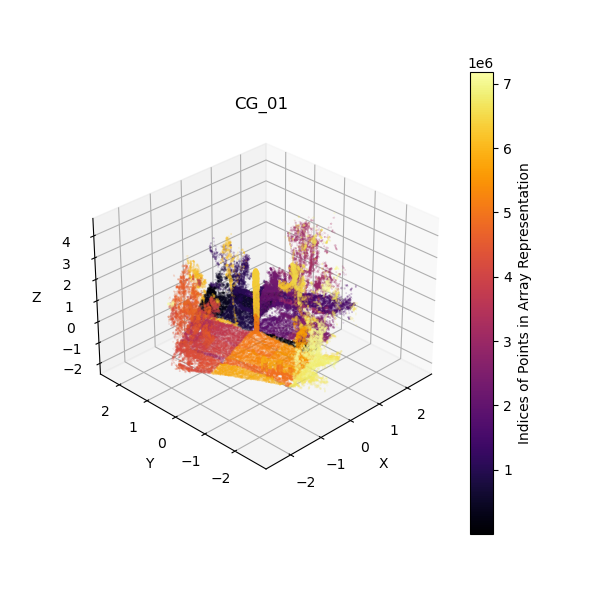

In [5]:
# Extra code which generates visualations for how the array representations for the point clouds differ from the spatial representations

from matplotlib.cm import ScalarMappable

# Create 3D scatter plots for existing point clouds
def PlotPointCloud2(df, view_elev, view_azim, title):
    fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.view_init(elev=view_elev, azim=view_azim)

    # Scatter plot with RGB colors
    # scatter = ax.scatter(df['X'], df['Y'], df['Z'], c=(df[['red', 'green', 'blue']].values), marker='o', alpha=0.3, s=0.05)
    mymax = max(df.index)
    mymin = min(df.index)
    mycolors = df.index
    mycolors = (mycolors - mymin) / mymax
    # display(mycolors, mymax, mymin)
    scatter = ax.scatter(df['X'], df['Y'], df['Z'], c=mycolors, cmap='inferno', marker='o', alpha=0.3, s=0.05)
    
    # Create a ScalarMappable for colorbar creation
    sm = ScalarMappable(cmap='inferno')
    sm.set_array(mycolors)
    sm.set_clim(mymin, mymax)  # Set the scale of the colorbar
    cbar = plt.colorbar(sm)
    cbar.set_label('Indices of Points in Array Representation')
    
    # Set axis labels
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    # Show the plot
    plt.show()
    
PlotPointCloud2(df_cg_01, 30, 225, 'CG_01')
# PlotPointCloud2(df_cg_02, 210, 200, 'CG_02')
# PlotPointCloud2(df_cg_03, 20, 190, 'CG_03')
# PlotPointCloud2(df_cg_04, 210, 190, 'CG_04')
# PlotPointCloud2(df_cg_05, 30, 225, 'CG_05')
# PlotPointCloud2(df_op_01, 30, 210, 'OP_01')
# PlotPointCloud2(df_op_02, 130, 330, 'OP_02')
# PlotPointCloud2(df_op_03, 30, 210, 'OP_03')
# PlotPointCloud2(df_op_04, 30, 200, 'OP_04')
# PlotPointCloud2(df_op_05, 50, 160, 'OP_05')